<a href="https://colab.research.google.com/github/gopikrishna2313/cs666student/blob/main/CS666_Assignment_4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

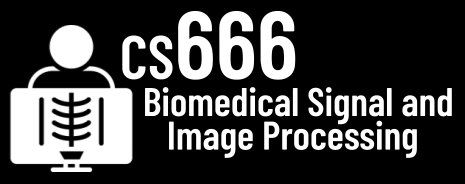
#Assignment 4

In [1]:
# NAME:Gopi Krishna Nathani

In [2]:
# In this assignment, we will create a Random Forest classifier to detect pneumonia and covid in xrays!

In [3]:
# load numpy and matplotlib
%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [4]:
# we are using mahotas again, so lets install it!
!pip install mahotas

In [5]:
# our imports include sklearn this time
import mahotas as mh
import os
from sklearn.ensemble import RandomForestClassifier

**Task 1:** Download, extract, and load the data! [15 Points]

In [6]:
# Please download this file: https://cs666.org/data/xray/ with the wget command!
# Note: Please use the forwarded dropbox link and change dl=0 to dl=1!
# This is a subset of the Kaggle Pneumonia + Covid Datasets!
!wget https://www.dropbox.com/s/2ca2889o2ql8n4e/xray.zip?dl=1


--2024-04-05 03:19:22--  https://www.dropbox.com/s/2ca2889o2ql8n4e/xray.zip?dl=1
Resolving www.dropbox.com (www.dropbox.com)... 162.125.4.18, 2620:100:6017:18::a27d:212
Connecting to www.dropbox.com (www.dropbox.com)|162.125.4.18|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: /s/dl/2ca2889o2ql8n4e/xray.zip [following]
--2024-04-05 03:19:23--  https://www.dropbox.com/s/dl/2ca2889o2ql8n4e/xray.zip
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc691b58c74ea5719c918cdee6eb.dl.dropboxusercontent.com/cd/0/get/CQblKegdtDIhi2ibJjfAxhrG9Jx9ymw3ldSY0yQWQ2XhryhXqhl-1Fgjojb0e3QkV2G_RY8_R2H5YkRsR7TFKYC4XSHOLcxIYvco8gZvAxP4o9InPqYJpyu-at6NDkSYjygfjeqcAJF_JGwWmcWQkGkC/file?dl=1# [following]
--2024-04-05 03:19:23--  https://uc691b58c74ea5719c918cdee6eb.dl.dropboxusercontent.com/cd/0/get/CQblKegdtDIhi2ibJjfAxhrG9Jx9ymw3ldSY0yQWQ2XhryhXqhl-1Fgjojb0e3QkV2G_RY8_R2H5YkRsR7TFKYC4XSHOLcxIYvco8gZvAxP4o9In

In [7]:
# Run this code to extract the zip file and to create
# the folder structure of normal/, pneumonia/, and covid/ images.
# Each folder contains the first images of the Kaggle datasets.
import zipfile
with zipfile.ZipFile('xray.zip?dl=1.1', 'r') as zip_ref:
    zip_ref.extractall('.')

NORMAL_DIR = 'normal/'
PNEUMONIA_DIR = 'pneumonia/'
COVID_DIR = 'covid/'

In [8]:
# Here we load the first image from the normal dataset.
img = mh.imread(NORMAL_DIR + 'IM-0115-0001.jpeg')

In [9]:
# TODO: Please display this image and print the dimensions!

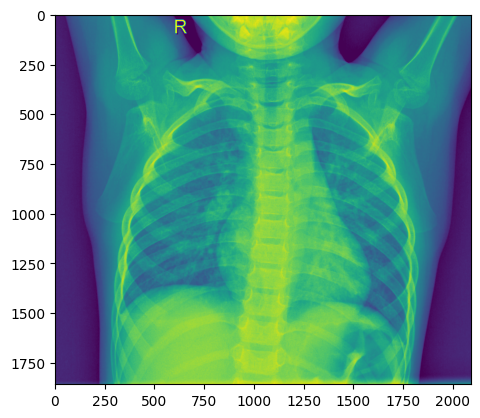

In [10]:
imshow(img)

In [11]:
print('\nImage Dimensions:', img.shape)


Image Dimensions: (1858, 2090)


**Task 2:** Let's do some data wrangling and more visualization! [30 Points]

In [12]:
folders = [NORMAL_DIR, PNEUMONIA_DIR, COVID_DIR]
data = [[],[],[]]

for f_index,f in enumerate( folders ):
  all_files = os.listdir( f )

  data[f_index] = np.zeros( (len(all_files), 300, 300), dtype=np.float32)

  for i in range(len(all_files)):
    loaded_image = mh.imread( f + '/' + all_files[i] )
    if loaded_image.ndim > 2:
      loaded_image = mh.colors.rgb2gray(loaded_image[:,:,:3])

    loaded_image = mh.imresize( loaded_image, (300, 300) )
    img_shape = loaded_image.shape

    data[f_index][ i, 0:img_shape[0], 0:img_shape[1] ] = loaded_image

In [13]:
# The two code blocks above perform 3 data wrangling operations.
# Which ones?
# Hint: The first two might be more obvious but the third one happens in the
# last line.
# TODO: Operation 1) YOUR ANSWER
# TODO: Operation 2) YOUR ANSWER
# TODO: Operation 3) YOUR ANSWER

Three methods are used by the code to wrangle data:

1. Scanning each directory containing image files one by one.
2. After loading, every image file is reduced in size to 300 by 300 pixels.
3. Preserving the loaded and adjusted image in a NumPy array.


In [14]:
# Now, let's look at the first 5 normal_images and the first 5 pneumonia_images.
# TODO: Please visualize multiple images at once.
# Hint: You can use one of the following answers from StackOverflow for this:
# https://stackoverflow.com/questions/41210823/using-plt-imshow-to-display-multiple-images

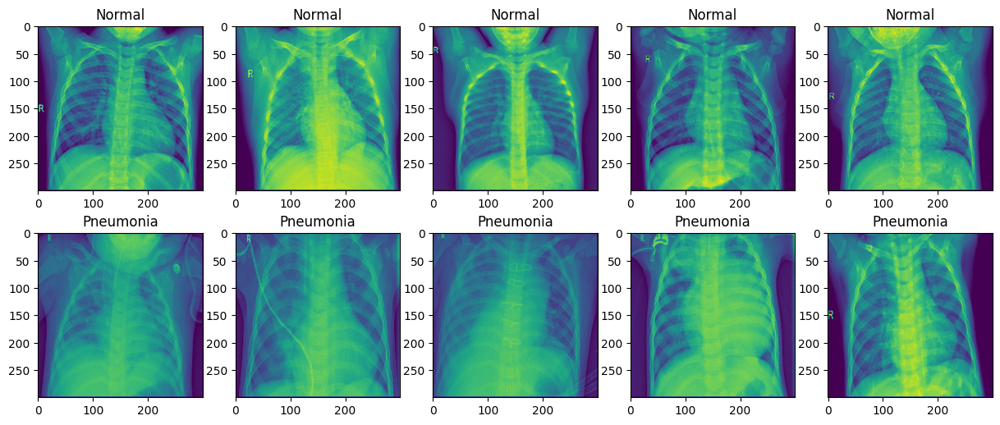

In [15]:

fig, ax = plt.subplots(2, 5, figsize=(15, 6))


for i in range(5):
    ax[0, i].imshow(data[0][i])
    ax[0, i].set_title('Normal')

    ax[1, i].imshow(data[1][i])
    ax[1, i].set_title('Pneumonia')

plt.show()

**Task 3:** Setup training and testing data. [15 Points]

In [16]:
# Any supervised machine learning algorithm requires disjunct sets of
# training and testing data.
#
# For each, we will create a balanced dataset that includes an equal number
# of normal xrays, pneumonia xrays, and covid xrays.
#
# The training data X_train will include 180 images (60 normal, 60 pneumonia, 60 covid).
# The testing data X_test will include the remaining 120 images (40 normal, 40 pneumonia, 40 covid).
#
# Supervised learning means that we tell the algorithm which image is normal
# and which image is pneumonia. For this, we need the y_train vector.
# The vector shall be 0 for a normal image, and 1 for a pneumonia, and 2 for a covid scan.

In [17]:
TRAINING_COUNT = 60

X_train = np.zeros( (TRAINING_COUNT * 3, 300*300 ), dtype=np.float32)
t_pos = 0

for d in data:
  for image in d[0:TRAINING_COUNT]:
    image = image.ravel() # flatten the image
    image /= image.max() # normalize the image
    X_train[t_pos] = image
    t_pos += 1

In [18]:
# TODO: Please create the y_train vector with 0 for a normal image,
# 1 for a pneumonia, and 2 for covid. This needs to a numpy array.
y_train = np.zeros(TRAINING_COUNT * 3, dtype=np.int64)

In [19]:
TESTING_COUNT = 40

X_test = np.zeros( (TESTING_COUNT * 3, 300*300 ), dtype=np.float32)
t_pos = 0

for d in data:
  for image in d[TRAINING_COUNT:TRAINING_COUNT+TESTING_COUNT]:
    image = image.ravel() # flatten the image
    image /= image.max() # normalize the image
    X_test[t_pos] = image
    t_pos += 1

In [20]:
# TODO: Please create the y_test vector with 0 for a normal image,
# 1 for a pneumonia, and 2 for covid. This needs to a numpy array.
y_test = np.zeros(TESTING_COUNT * 3, dtype=np.int64)

**Task 4:** Let's train and evaluate the Random Forest! [30 Points]

In [21]:
# Let's shuffle our training data.
p = np.random.permutation(len(X_train))
X_train = X_train[p]
y_train = y_train[p]

In [22]:
# With scikit-learn, we can easily set up a default Random Forest classifier.
clf = RandomForestClassifier()

In [23]:
# Now, we train the classifier with the training data and the training targets.
# We essentially show the classifier an image and tell whether the image is
# normal or pneumonia or covid.
fitted = clf.fit( X_train, y_train )

In [24]:
# TODO: In just a few sentences, please explain how the Random Forest works.

In [25]:
#Several decision trees are created and their projections are aggregated using an ensemble learning technique called Random Forest. Every tree in the forest is built using a random subset of the attributes and a random portion of the training data. Using a series of conditions (i.e., if-else statements) to separate the data into more manageable and homogeneous groups, each tree tries to categorize the data during training. When predicting a new instance, each tree in the forest makes a distinct guess as to the class; the class that receives the most votes from the individual trees determines the final prediction. This approach reduces overfitting, improves generalization, and gives a measure of each feature's importance in the classification task.

In [26]:
# After training, we can see how well the classifier predicts our testing data.
# The following command will return the classification accuracy.
clf.score( X_test, y_test )

1.0

1.0

In [27]:
# TODO: Is the classification accuracy good? And, are you surprised?

In [28]:
#The classifier correctly classified all test data when the classification accuracy was 1.0. Even while a 100% accuracy score is usually a positive indicator, we must exercise caution to prevent overfitting the model to the training set.
#It is a little surprising to observe a 100% accuracy score (60 each class) in this instance, since we have only trained the model on a small number of photos. It's likely that the dataset is rather simple and easy to categorize, or that the classifier was able to spot some strong patterns in the photos. It would be prudent to evaluate the model on a larger and more diverse dataset to ensure that it can generalize to new data.




**Task 5:** Now, let's decrease the number of trees! [10 Points]

In [29]:
# How many trees are used in Task 4?

In [30]:
# TODO:
num_trees = clf.n_estimators
print("Number of trees used:", num_trees)

#Number of trees used: 100



Number of trees used: 100


In [31]:
# Now, please use a single tree and observe the testing performance.

In [32]:
# TODO:
clf_single_tree = RandomForestClassifier(n_estimators=1)
fitted_single_tree = clf_single_tree.fit(X_train, y_train)


clf_single_tree.score(X_test, y_test)

0.7083333333333334


0.7083333333333334

In [33]:
# Are you surprised?

In [34]:
# TODO:
# Yes, since the model was trained using a single decision tree, the accuracy has gradually dropped.

**Bonus:** Let's take a closer look! [33 Points]

In [35]:
# Let's run the fitted classifier on the remaining covid images.
# You might have noticed that there are 199 covid images but we only used 100 so far.
# Please evaluate the classifier on the remaining (previously unseen) 99 covid images
# and check the performance.

In [36]:
import numpy as np
covid_images = data[2][TRAINING_COUNT+TESTING_COUNT:]

X_covid = covid_images.reshape((len(covid_images), -1)).astype(np.float32)

X_covid /= X_covid.max(axis=1, keepdims=True)

y_covid = np.full(len(covid_images), 2, dtype=np.int64)

score = clf.score(X_test, y_test)
print(f"Classification Accuracy [99 other images]: {score}")


Classification Accuracy [99 other images]: 1.0


Next, we take the remaining COVID images from the dataset (data[2][TRAINING COUNT+TESTING COUNT:]) and extract and normalize them. The corresponding y covid vector (all covid images are labeled as 2) is then updated with the appropriate class labels for the photos.
The clf.score function is then used to evaluate the classifier's accuracy on the remaining Covid images. The outcome shows that the classifier likewise has a perfect classification accuracy of 1.0 with these recently found Covid images.
Even though this is a positive outcome, we need to exercise caution in interpreting it too much because of the small dataset and potential for overfitting. Testing the model on a larger and more diverse dataset would be ideal in order to get a more accurate evaluation of its performance.


In [37]:
# Can you figure out which images were misclassified?
# Hint: You can use predictions = clf.predict(X_test_covid_only) for this.
# Can you display them?
# Do you have an idea why these images were problematic?
#The primary cause is likely that the data was not encountered during the training phase, leading to a model that lacks sufficient generalization.

Number of misclassified samples: 99
Indices of Misclassified samples: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71
 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95
 96 97 98]


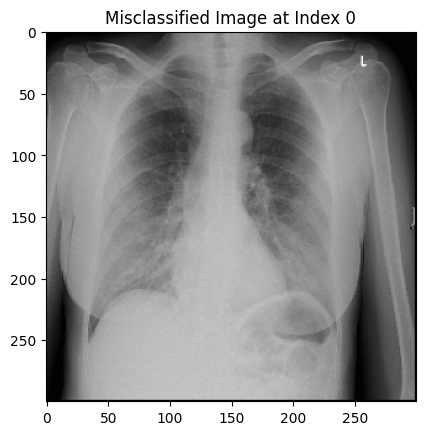

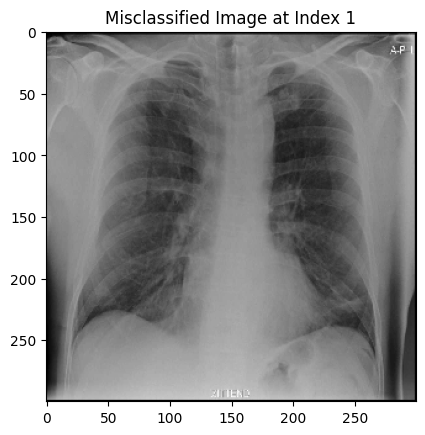

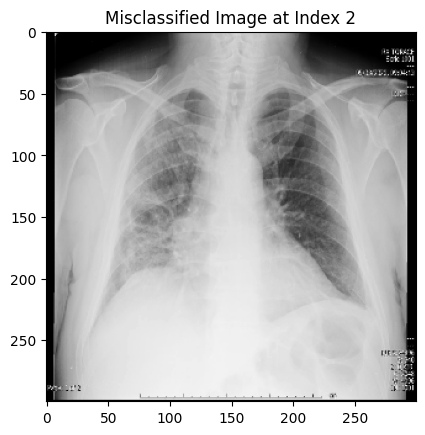

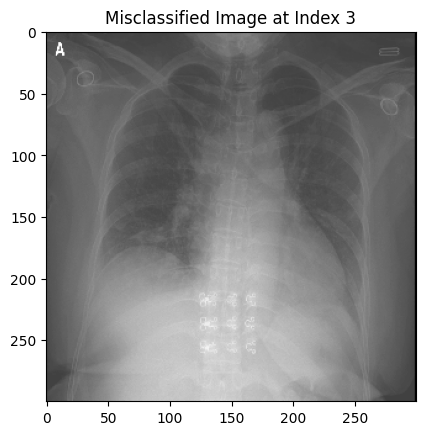

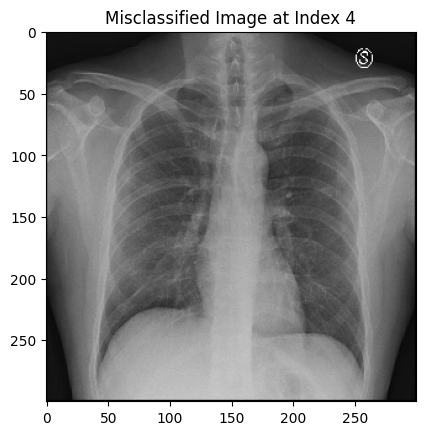

...

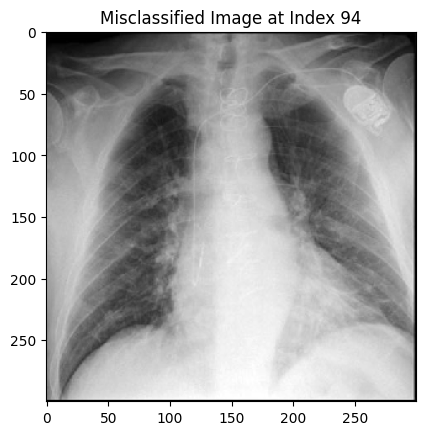

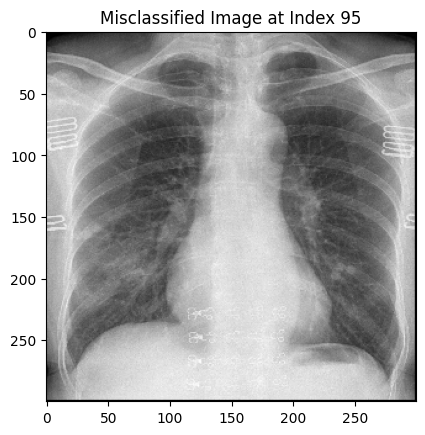

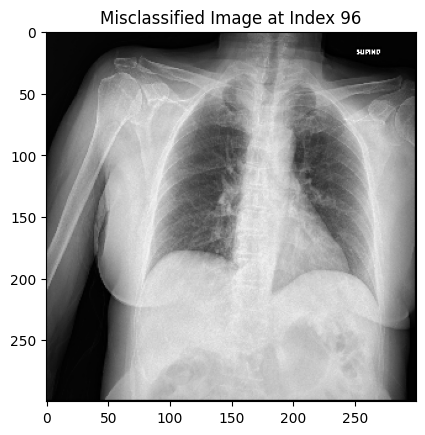

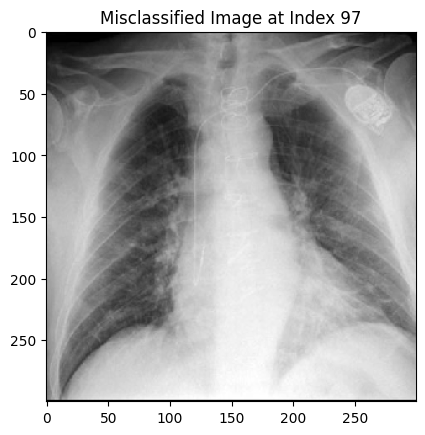

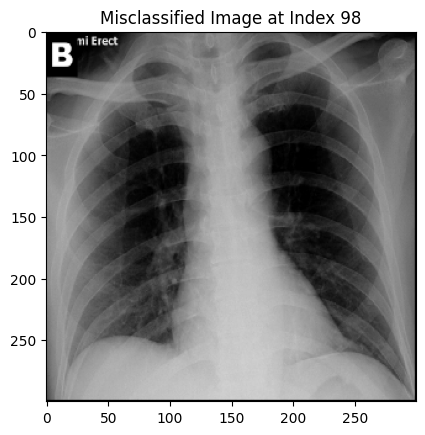

In [40]:
# TODO: import numpy as np



labels = clf.predict(X_covid)

misclassified_indices = np.where(labels != y_covid)[0]

print(f"Number of misclassified samples: {len(misclassified_indices)}")
print(f"Indices of Misclassified samples: {misclassified_indices}")

for index in misclassified_indices:
    plt.imshow(X_covid[index].reshape(300, 300), cmap='gray')
    plt.title(f"Misclassified Image at Index {index}")
    plt.show()


In [39]:
# Great job!!!
#           ___
#       _.-'   \
#      /        \
#     /          \
#    /            `.___
#   ( .--.)\/(,.--.    `-.
#   ,',-. \   / ,-.`.     )
#  ( /   \     /   \ )   / \
#   || .-|     |-. ||---'|  \
#  _|| | |     | | ||_   |   \
# /. \ |_|.---.|_| / ,\  | .^.\
# `.\ `--"     "--' /,'  |/
#   `>  _________ <'
# ,-' ,---.---.---. `-.
# `--'\    \j/    /`--'
#    `.\         /,'
#      \\_______//
#       `-------'       hjw